Попробуем научить модель генерировать изображения покемонов. Импортируем библиотеки и настраиваем гиперпараметры:

In [15]:
import torch
import csv
import numpy as np
import matplotlib.pyplot as plt
import os
import torchvision
from os.path import isfile
from torch import nn
from torchsummary import summary
from torchvision import transforms as T
from torchvision.transforms import v2 as T2
from tqdm.notebook import tqdm
from skimage import io
from pandas import read_csv
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from PIL import Image
torch.manual_seed(42)
gpu = "cuda"
batch_size = 128
noise_vec_dim = 1024
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.99
epochs = 1000

[Датасет](https://www.kaggle.com/datasets/lantian773030/pokemonclassification) включает 7000 изображений покемонов. Его сначала пришлось отформатировать, чтобы его принял pytorch, код для этой цели закомментирован:

In [16]:
"""
id = 0 #мера против дубликатов
pokemon_id = 0 
directory = r"C:\\Users\\Professional\\Pictures\\PokemonData"
for pokemon in os.listdir(directory):
    subdir = directory + "\\" + pokemon
    for file in os.listdir(subdir):
        pics=open("C:\\Users\\Professional\\Pictures\\pokemon_pictures.csv", 'a')
        writer=csv.writer(pics)
        writer.writerow([str(id)+file, pokemon_id])
        pics.close()
        os.rename(subdir+"\\"+file, directory+'\\'+str(id)+file)
        id += 1
    pokemons=open("C:\\Users\\Professional\\Pictures\\pokemon_list.csv", 'a')
    writer=csv.writer(pokemons)
    writer.writerow([pokemon, pokemon_id])
    pokemons.close()
    pokemon_id += 1
"""

'\nid = 0 #мера против дубликатов\npokemon_id = 0 \ndirectory = r"C:\\Users\\Professional\\Pictures\\PokemonData"\nfor pokemon in os.listdir(directory):\n    subdir = directory + "\\" + pokemon\n    for file in os.listdir(subdir):\n        pics=open("C:\\Users\\Professional\\Pictures\\pokemon_pictures.csv", \'a\')\n        writer=csv.writer(pics)\n        writer.writerow([str(id)+file, pokemon_id])\n        pics.close()\n        os.rename(subdir+"\\"+file, directory+\'\\\'+str(id)+file)\n        id += 1\n    pokemons=open("C:\\Users\\Professional\\Pictures\\pokemon_list.csv", \'a\')\n    writer=csv.writer(pokemons)\n    writer.writerow([pokemon, pokemon_id])\n    pokemons.close()\n    pokemon_id += 1\n'

Теперь нужно привести все изображения к единому размеру (по ходу дела пришлось вручную починить поломанные расширения, а 12 векторных картинок вручную переделать в растровые)

In [17]:
"""
directory = r"C:\\Users\\Professional\\Pictures\\PokemonData"
for pokemon in os.listdir(directory):
    if isfile(directory + "\\" + pokemon):
        image = Image.open(directory + "\\" + pokemon).convert('RGB')
        resized = image.resize((128, 128))
        resized.save(directory + "_resized\\" + pokemon)
"""

'\ndirectory = r"C:\\Users\\Professional\\Pictures\\PokemonData"\nfor pokemon in os.listdir(directory):\n    if isfile(directory + "\\" + pokemon):\n        image = Image.open(directory + "\\" + pokemon).convert(\'RGB\')\n        resized = image.resize((128, 128))\n        resized.save(directory + "_resized\\" + pokemon)\n'

Уже обработанный датасет: https://drive.google.com/file/d/1NaQW8ep0sq0AssCA05I7_hRYVMS_mU2C/

Разметка датасета: https://drive.google.com/file/d/1sAqgZsDep1SG4P1eCLwLSg6LWftA8Vdi/

Теперь загрузим размеченный датасет в pytorch:

In [18]:

class pokemon_dataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.annotations = read_csv(csv_file)
        #print(self.annotations)
        self.root_dir = root_dir
        self.transform = transform 
    def __len__(self):
        return len(self.annotations)
    def __getitem__(self, index):
        img_path = os.path.join(self.root_dir, self.annotations.iloc[index, 0])
        image = io.imread(img_path)
        y_label = torch.tensor(self.annotations.iloc[index, 1])
        if self.transform:
            image = self.transform(image)
        return(image, y_label)
trainset=pokemon_dataset("C:\\Users\\Professional\\Pictures\\pokemon_pictures.csv","C:\\Users\\Professional\\Pictures\\PokemonData_resized",T.ToTensor() )

Total images in trainset: 6836
torch.Size([128, 128, 3])


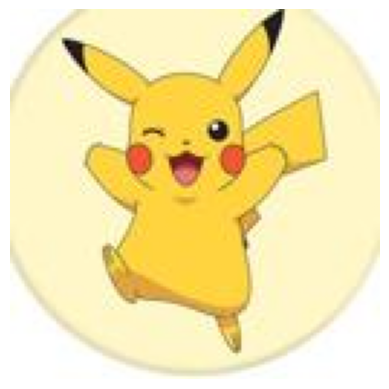

In [19]:
def add_gaussian_noise(image, mean=0, std_dev=0.1):
    noise = torch.normal(mean=mean, std=std_dev, size=image.shape, device=image.device, dtype=image.dtype)
    noisy_image = image + noise
    return noisy_image

print(f"Total images in trainset: {len(trainset)}")
image, label = trainset[4540]
image = image.swapaxes(0,1)
image = image.swapaxes(1,2)
size = image.shape
print(size)
plt.axis('off') 
plt.imshow(image.squeeze(), cmap="gray");

Разобъём датасет на батчи:

In [20]:
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
for inputs, labels in trainloader:
    inputs, labels = inputs.to(gpu), labels.to(gpu)
print(f"Total number of batches in trainloader: {len(trainloader)}")

Total number of batches in trainloader: 54


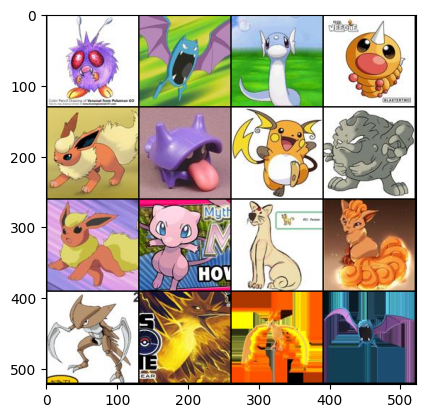

In [21]:
for image, _ in trainloader:
  break
def show_tensor_images(tensor_img, num_images = 16, size=(1, 28, 28)):
    unflat_img = tensor_img.detach().cpu()
    img_grid = make_grid(unflat_img[:num_images], nrow=4)
    plt.imshow(img_grid.permute(1, 2, 0).squeeze())
    plt.show()
show_tensor_images(image, num_images=16)

Построим дискриминатор и генератор:

In [22]:
def get_disc_block(in_channels, out_channels, kernel_size, stride):
  return nn.Sequential(
      nn.Conv2d(in_channels, out_channels, kernel_size, stride),
      nn.BatchNorm2d(out_channels),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()

    self.block_1 = get_disc_block(3, 16, (3, 3), 2)
    self.block_2 = get_disc_block(16, 32, (5, 5), 2)
    self.block_3 = get_disc_block(32, 64, (5,5), 2)
    self.block_4 = get_disc_block(64, 128, (5,5), 2)
    self.block_5 = get_disc_block(128, 256, (5,5), 2)
    self.flatten = nn.Flatten()

  def forward(self, images):
    x1 = add_gaussian_noise(self.block_1(images))
    x2 = add_gaussian_noise(self.block_2(x1))
    x3 = add_gaussian_noise(self.block_3(x2))
    x4 = add_gaussian_noise(self.block_4(x3))
    x5 = add_gaussian_noise(self.block_5(x4))
    x6 = add_gaussian_noise(self.flatten(x5))
    self._to_linear = x6.shape[1]
    self.linear = nn.Linear(self._to_linear, 1).to(gpu)
    x7 = add_gaussian_noise(self.linear(x6))

    return x7



D = Discriminator()
D.to(gpu)


Discriminator(
  (block_1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (block_2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (block_3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (block_4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (block_5): Sequential(
    (0): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(256, eps=1e-0

In [26]:
def get_gen_block(in_channels, out_channels, kernel_size, stride, final_block=False):
  if final_block:
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride),
        nn.Tanh()
    )
  return nn.Sequential(
      nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride),
      nn.BatchNorm2d(out_channels),
      nn.ReLU()
  )

class Generator(nn.Module):
  def __init__(self, noise_vec_dim):
    super(Generator, self).__init__()

    self.noise_vec_dim = noise_vec_dim
    self.block_1 = get_gen_block(noise_vec_dim, 1024, (3,3), 2)
    self.block_2 = get_gen_block(1024, 512, (3,3), 2)
    self.block_3 = get_gen_block(512, 256, (3,3), 2)
    self.block_4 = get_gen_block(256, 128, (4,4), 2)
    self.block_5 = get_gen_block(128, 64, (4,4), 2)
    self.block_6 = get_gen_block(64, 3, (4,4), 2, final_block=True)

  def forward(self, random_noise_vec):
    # (b, noise_vec_dim) -> (b, noise_vec_dim, 1, 1)
    x = random_noise_vec.view(-1, self.noise_vec_dim, 1, 1)

    x1 = self.block_1(x)
    x2 = self.block_2(x1)
    x3 = self.block_3(x2)
    x4 = self.block_4(x3)
    x5 = self.block_5(x4)
    x6 = self.block_6(x5)
    return x6
        
G = Generator(noise_vec_dim)
G.to(gpu)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight, 0.0, 0.02)
        nn.init.constant_(m.bias, 0)

Теперь создадим функцию потерь:

In [24]:
def real_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  ground_truth = torch.ones_like(disc_pred)
  loss = criterion(disc_pred, ground_truth)
  return loss

def fake_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  ground_truth = torch.zeros_like(disc_pred)
  loss = criterion(disc_pred, ground_truth)
  return loss

D_opt = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta_1, beta_2))
G_opt = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta_1, beta_2))

Момент истины - обучаем модель!

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999704..0.99992585].


Epoch: 1 --- D_loss: 0.7249544671288243 --- G_loss: 0.7150208828625856


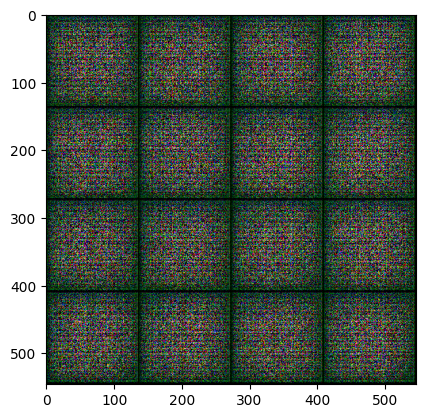

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99997187..0.99999046].


Epoch: 2 --- D_loss: 0.7021282922338556 --- G_loss: 0.7125086696059616


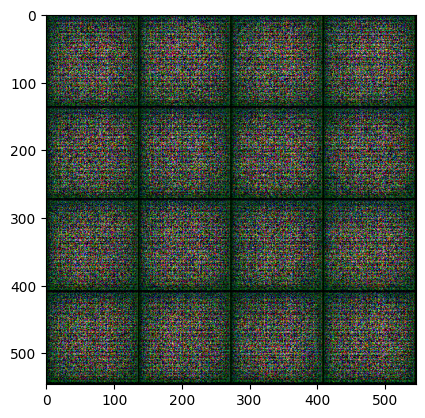

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999995..0.99994063].


Epoch: 3 --- D_loss: 0.7135641574859619 --- G_loss: 0.712405229056323


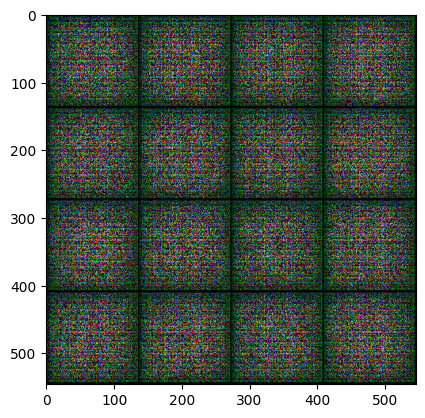

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999918..0.9999374].


Epoch: 4 --- D_loss: 0.7228366434574127 --- G_loss: 0.7088136148673517


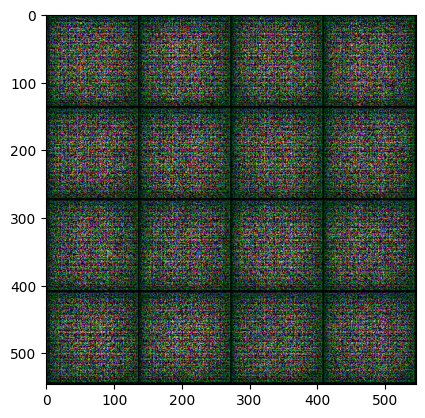

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999739..0.99996287].


Epoch: 5 --- D_loss: 0.7180294129583571 --- G_loss: 0.7224970239180105


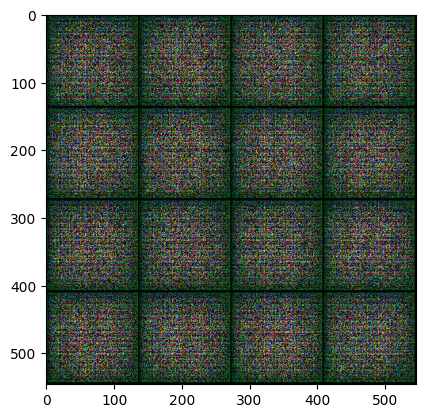

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999539..0.999913].


Epoch: 6 --- D_loss: 0.7059457202752432 --- G_loss: 0.709226875393479


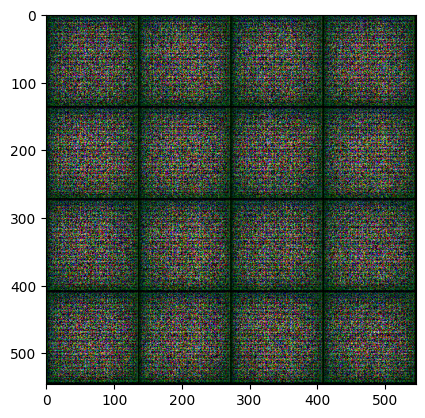

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99995935..0.99992615].


Epoch: 7 --- D_loss: 0.7145152213396849 --- G_loss: 0.7226715948846605


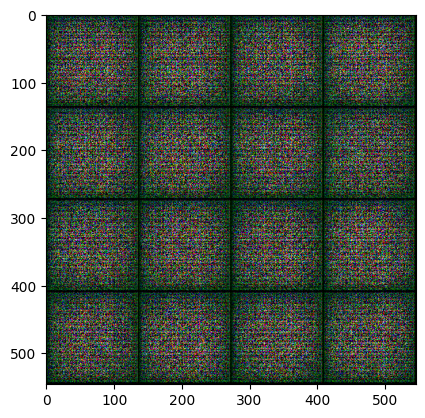

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999985..0.99992704].


Epoch: 8 --- D_loss: 0.72566517746007 --- G_loss: 0.7363524613557039


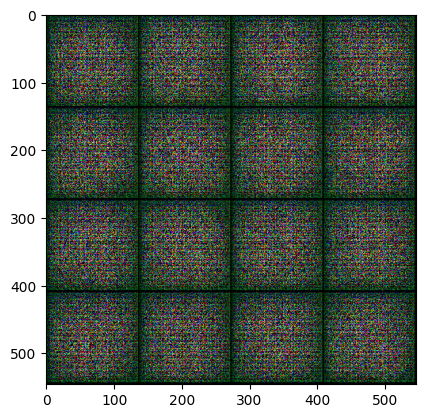

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99999297..0.99996674].


Epoch: 9 --- D_loss: 0.7116412939848723 --- G_loss: 0.7034019231796265


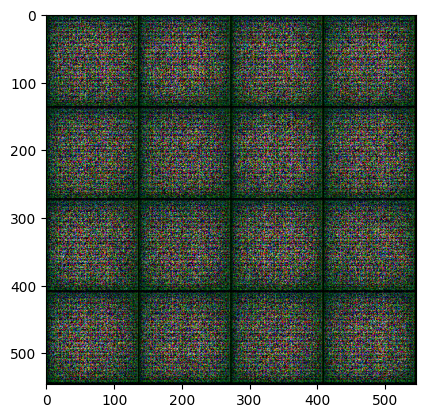

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999959..0.9999571].


Epoch: 10 --- D_loss: 0.7150350389657197 --- G_loss: 0.719667003110603


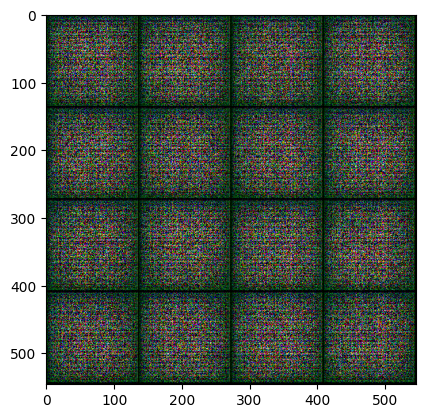

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.999948..0.99992186].


Epoch: 11 --- D_loss: 0.7183670942430143 --- G_loss: 0.6988963076361904


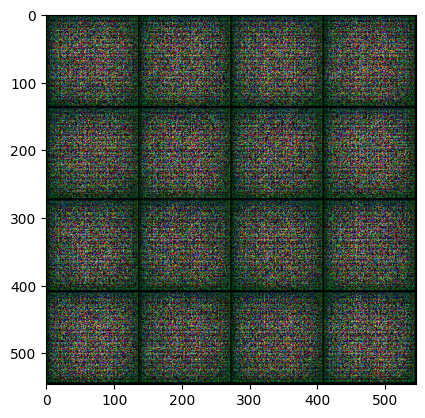

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999697..0.9999585].


Epoch: 12 --- D_loss: 0.7061808793633072 --- G_loss: 0.6984324830549734


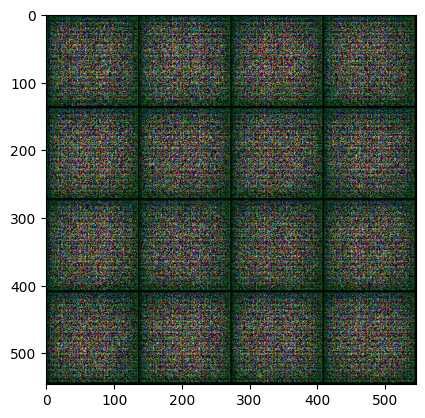

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99998796..0.9999792].


Epoch: 13 --- D_loss: 0.7151504666716965 --- G_loss: 0.7174937691953447


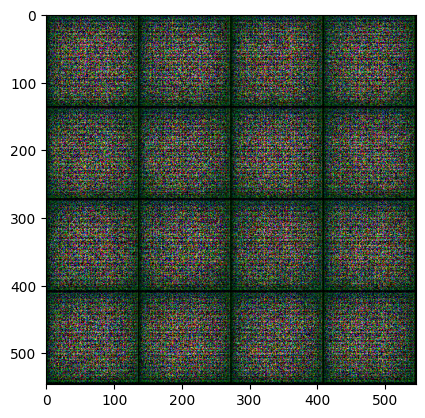

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999689..0.9999528].


Epoch: 14 --- D_loss: 0.7145508461528354 --- G_loss: 0.7285440199904971


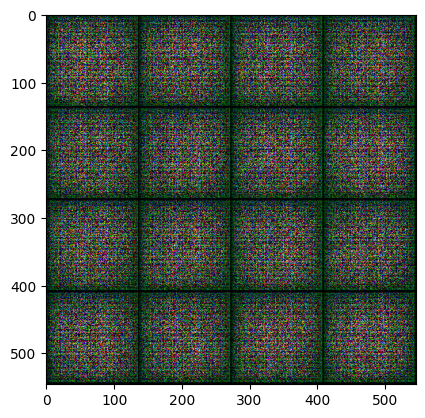

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999784..0.9999463].


Epoch: 15 --- D_loss: 0.7089830769432915 --- G_loss: 0.7058853562231417


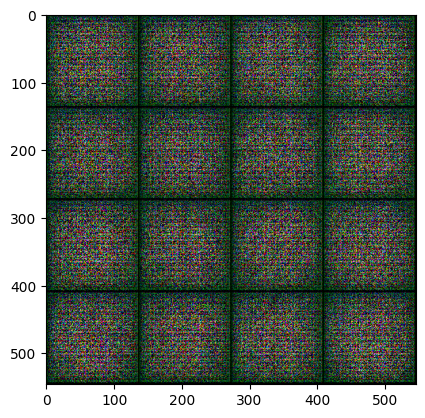

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999882..0.999921].


Epoch: 16 --- D_loss: 0.715696766420647 --- G_loss: 0.7185887219729247


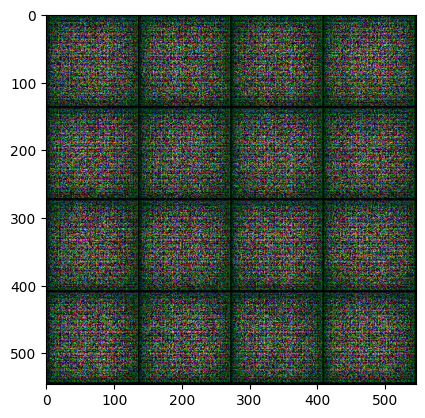

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999914..0.99998534].


Epoch: 17 --- D_loss: 0.7051277502819344 --- G_loss: 0.7021266409644374


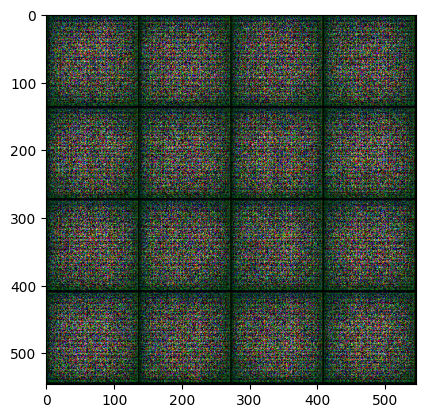

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999776..0.9998929].


Epoch: 18 --- D_loss: 0.7102537916766273 --- G_loss: 0.7016103333897061


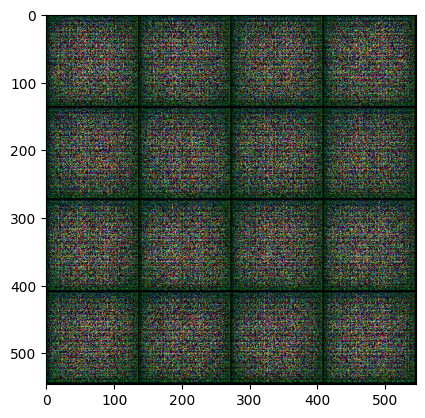

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99999136..0.9999723].


Epoch: 19 --- D_loss: 0.7024423137859062 --- G_loss: 0.699765165646871


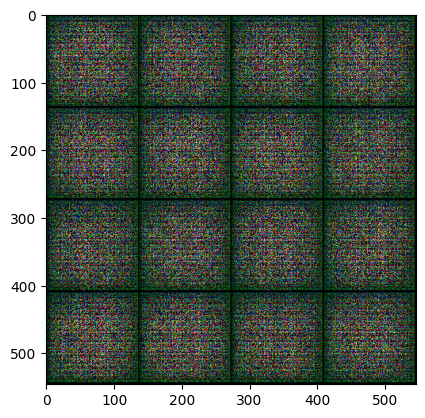

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99998415..0.9999245].


Epoch: 20 --- D_loss: 0.7285418234489582 --- G_loss: 0.7287046776877509


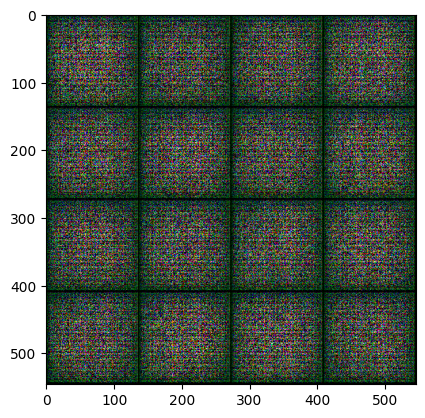

  0%|          | 0/54 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999767..0.99991333].


Epoch: 21 --- D_loss: 0.71529824424673 --- G_loss: 0.7232357936876791


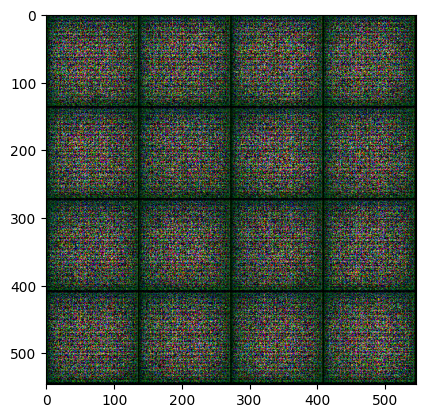

  0%|          | 0/54 [00:00<?, ?it/s]

: 

In [27]:


for i in range(epochs):
  total_d_loss = 0.0
  total_g_loss = 0.0

  for real_image, _ in tqdm(trainloader):
    real_image = real_image.to(gpu)

    # calculate loss and update weights for D
    D_opt.zero_grad()

    noise = torch.randn(batch_size, noise_vec_dim, device=gpu)
    fake_image = G(noise)
    D_pred = D(fake_image)
    D_fake_loss = fake_loss(D_pred)

    D_pred = D(real_image)
    D_real_loss = real_loss(D_pred)

    D_loss = (D_fake_loss + D_real_loss) / 2

    total_d_loss += D_loss.item()

    D_loss.backward()
    D_opt.step()

    # calculate loss and update weights for G
    G_opt.zero_grad()

    noise = torch.randn(batch_size, noise_vec_dim, device=gpu)
    fake_image = G(noise)
    D_pred = D(fake_image)
    G_loss = real_loss(D_pred)

    total_g_loss += G_loss.item()

    G_loss.backward()
    G_opt.step()

  avg_d_loss = total_d_loss / len(trainloader)
  avg_g_loss = total_g_loss / len(trainloader)

  print(f"Epoch: {i+1} --- D_loss: {avg_d_loss} --- G_loss: {avg_g_loss}")
  show_tensor_images(fake_image)
